<a href="https://colab.research.google.com/github/JGCMachado/Portfolio/blob/main/MVP2_Chest_XRay_3classes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning & Analytics (**Segunda Parte**)
Profs. Hugo Villamizar e Patrik Happ

#Aluno: José Guilherme Campos Machado

Este trabalho é referente a segunda parte do MVP da segunda sprint (Machine Learning & Analytics) do curso de Pós-Graduação em Ciência de Dados e Analytics da PUC-RJ.

Nele será treinado um modelo baseado em Deep Learning para resolver um problema de visão computacional, iniciando na carga e preparação dos dados, incluindo a separação entre treino e teste, modelagem, otimização de hiperparâmetros, até a avaliação e comparação de resultados dos modelos treinados.

Para acessar apenas ao notebook contendo a primeira parte utilizar o link:

##1.0 Diagnóstico da Pneumonia - Definição do problema

A pneumonia é uma doença respiratória grave que afeta milhões de pessoas em todo o mundo, sendo uma das principais causas de problemas de saúde e mortalidade, especialmente em crianças, idosos e pessoas com sistemas imunológicos enfraquecidos. A pneumonia pode ser causada por bactérias, vírus ou fungos, e seus sintomas incluem tosse, febre, dificuldade respiratória e dor no peito.

O diagnóstico precoce e preciso da pneumonia é muito importante na prevenção de complicações graves e na melhoria dos resultados de tratamento. Um diagnóstico rápido permite que os profissionais de saúde iniciem o tratamento adequado, seja com antibióticos para pneumonia bacteriana ou terapia antiviral para pneumonia viral, reduzindo assim o risco de complicações e mortes.

A proposta desse trabalho consistem em treinar um modelo capaz de identificar através de uma radiografia de tórax se a aparência dos pulmões está normal ou se apresenta indícios de pneumonia bacteriana ou viral.

In [ ]:
# Importação da imagem
from IPython.display import Image
Image(url='https://raw.githubusercontent.com/JGCMachado/Imagens/main/chestxray.jpg')

O  conjunto de imagens desse trabalho foi adaptado do Kaggle "Chest X-Ray Images (Pneumonia)". O conjunto original é separado em dois diretórios, um  contendo imagens com diagnósticos normais e outro com imagens de diagnósticos de pneumonia e o desafio é identificar as 2 classes.

As imagens originais podem ser encontradas no endereço abaixo:

https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia

Como o diretório com imagens de diagnóstico de pneumonia contem arquivos com nomes que podem ser separados em pneumonia bacteriana ou viral, optei por criar as 3 classes.


In [ ]:
#!pip install gdown

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras import regularizers
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
import gdown

In [ ]:
# configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

**Definição de funções**

Aqui é definida a função para gerar a matriz de confusão que será utilizada durante o trabalho

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predição')

##2.0 Preparação dos dados

Para poder trabalhar com 3 classes ao invés de apenas as 2 originais selecionei 1200 imagens de cada uma das classes e os arquivos foram renomeados e serão trabalhados a partir de um unico diretório

Devido ao tamanho, o arquivo está disponível não no Github mas no Google Drive. Ele será baixado, descompactado e tratado durante a execução no próprio ambiente do Colab.

Após a descompactação fartemos uma verificação do numero de imagens descompactadas no diretório destino e veremos os nomes dos 20 primeiros arquivos


In [ ]:
# Path onde se encontra o arquivo 'train3classes.zip'
file_id = '1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4'
url = f"https://drive.google.com/uc?id={file_id}"
output = "train3classes.zip"
gdown.download(url, output)


Downloading...
From: https://drive.google.com/uc?id=1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4
To: /content/train3classes.zip
100%|██████████| 949M/949M [00:05<00:00, 188MB/s]


'train3classes.zip'

In [ ]:
# Criando a pasta de destino onde serão descompactados os arquivos do 'train3classes.zip'
train = 'train3classes.zip'
destination = 'datasets/chest/train3classes/'

os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

In [ ]:
print(f"Temos um total de {len(os.listdir(destination))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 3600 imagens para o treinamento e avaliação do modelo de deep learning


In [ ]:
print(f"Primeiras 20 imagens: \n {os.listdir(destination)[:20]}")

Primeiras 20 imagens: 
 ['virus (805).jpeg', 'normal (1126).jpeg', 'virus (667).jpeg', 'virus (558).jpeg', 'normal (1110).jpeg', 'virus (694).jpeg', 'virus (6).jpeg', 'normal (329).jpeg', 'normal (1173).jpeg', 'normal (1087).jpeg', 'bacteria (1085).jpeg', 'normal (434).jpeg', 'virus (1022).jpeg', 'virus (677).jpeg', 'bacteria (1153).jpeg', 'bacteria (369).jpeg', 'bacteria (36).jpeg', 'virus (1001).jpeg', 'normal (260).jpeg', 'normal (333).jpeg']


### 2.1 Carga das imagens e definição das classes

Faremos agora a cargas dos metadados das imagens em um dataset e definiremos a classe através do nome do arquivo da imagem. Elas serão classificadas em "normal", "bacteria" e "virus"

Veremos os primeiros registros do dataset e um gráfico com o balanceamento entre as classes

In [ ]:
images =os.listdir(destination)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    classe = str(fname)[:5]
    if classe == 'norma':
       labels.append('normal')
    elif classe == 'virus':
       labels.append('virus')
    else:
       labels.append('bacteria')

    img_shape = mpimg.imread(destination+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    if len(img_shape) > 2:
       channels.append(img_shape[2])
    else:
       channels.append(2)  # Defina um valor padrão para canais se não houver terceira dimensão
    filesize.append(os.path.getsize(destination+fname))

# Criação do dataset
chest_xray = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [ ]:
chest_xray.head()

,images,class,height,width,channels,filesize
0,virus (805).jpeg,virus,543,854,3,36418
1,normal (1126).jpeg,normal,1028,1304,2,404220
2,virus (667).jpeg,virus,1056,1448,2,111670
3,virus (558).jpeg,virus,670,928,3,74504
4,normal (1110).jpeg,normal,1136,1230,2,437091


In [ ]:
chest_xray.count()

images      3600
class       3600
height      3600
width       3600
channels    3600
filesize    3600
dtype: int64

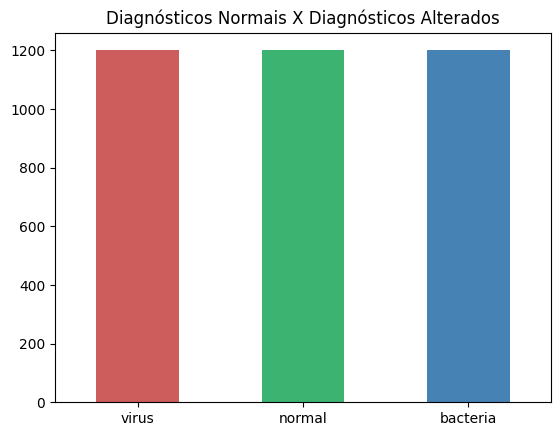

In [ ]:
# Obtenha os valores e as contagens das classes
class_counts = chest_xray['class'].value_counts()

# Defina os tons médios de verde, vermelho e azul para cada classe
colors = ['indianred',  'mediumseagreen', 'steelblue']  # Exemplo de tons médios de cores pré-definidas

# Crie a figura e o eixo
fig, ax = plt.subplots()

# Crie o gráfico de barras com os tons médios de cores
class_counts.plot(kind='bar', color=colors, ax=ax)

# Configure o título do gráfico
ax.set_title('Diagnósticos Normais X Diagnósticos Alterados')

# Rotacione os rótulos do eixo x para a posição horizontal
ax.set_xticklabels(class_counts.index, rotation=0)

# Exiba o gráfico
plt.show()

### 2.2 Exemplo de algumas imagens

Visualizaremos a seguir 12 imagens aleatórias do diretório

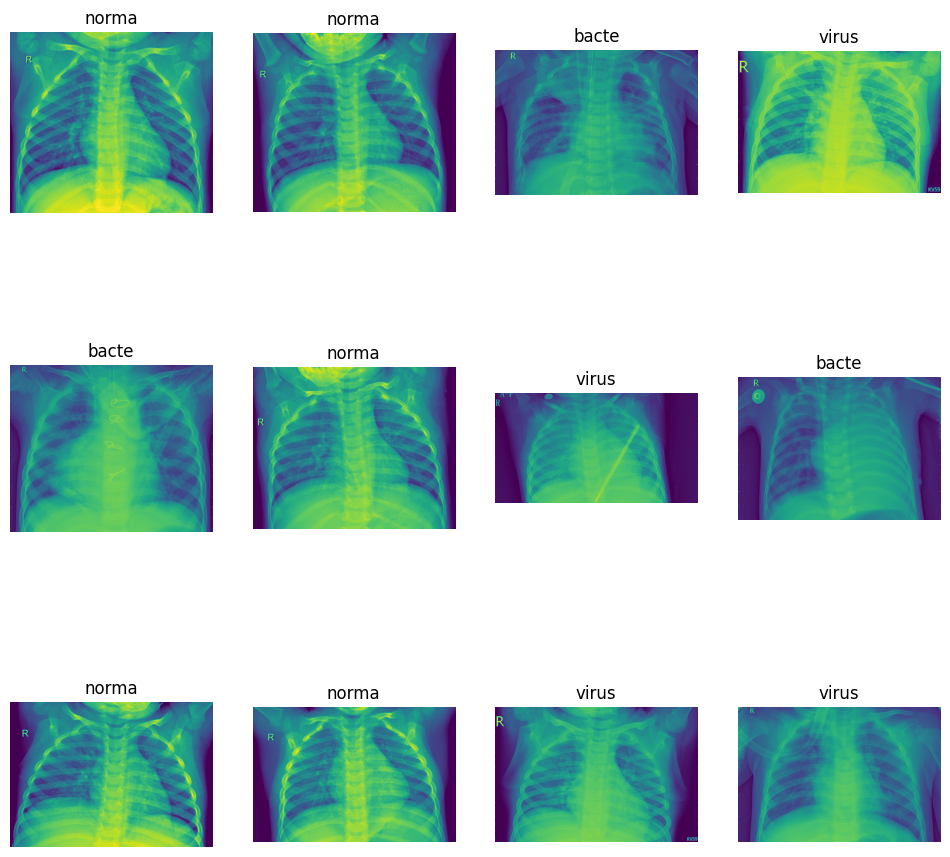

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando as imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =destination+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:5])

plt.show()

### 2.3 Separação em dados de treino e de teste

Os dados serão divididos em 30% para teste e 70% para treino do modelo

In [ ]:
train, test =train_test_split(chest_xray[['images' , 'class']] ,test_size=0.3 ,random_state=9 , shuffle=True)

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                   images     class
258   bacteria (129).jpeg  bacteria
1917     virus (608).jpeg     virus
2320  bacteria (290).jpeg  bacteria
2298  bacteria (162).jpeg  bacteria
3361  bacteria (821).jpeg  bacteria
...                   ...       ...
2104     virus (241).jpeg     virus
501   bacteria (999).jpeg  bacteria
2686     virus (361).jpeg     virus
348      virus (988).jpeg     virus
382   bacteria (124).jpeg  bacteria

[2520 rows x 2 columns]
##### Test: #####
                   images     class
185     virus (1019).jpeg     virus
119    normal (1111).jpeg    normal
3332    virus (1003).jpeg     virus
2426  bacteria (608).jpeg  bacteria
716      virus (373).jpeg     virus
...                   ...       ...
2319   bacteria (10).jpeg  bacteria
1469    normal (588).jpeg    normal
1452   normal (1041).jpeg    normal
2228    normal (884).jpeg    normal
2831    normal (649).jpeg    normal

[1080 rows x 2 columns]


### 2.4 Aumentando o numero de imagens

Utilizaremos a classe utilitária ImageDataGenerator do TensorFlow para gerar novas imagens baseado nas imagens originais. O ImageDataGeneretor tem por finalidade gerar imagens aumentadas e em outros angulos (data argumentation).

Abaixo são definidos alguns parametros utilizado pelo ImageDataGenerator. Realizei varios testes variando o batch size (30, 50, 80 e 100) e o tamanho das imagens (100, 150, 250, 350, 450, 500, 600 e 700 ) para chegar em valores onde eu tivesse uma imagem maior para facilitar o aprendizado mas que coubesse dentro do tamanho de memória disponível no Colab. Tamanhos maiores de imagens ou batch size esgotavam a memória do ambiente.

Os tamanhos abaixo foram os tamanhos onde eu consegui a melhor relação para o tamanho de imagem.

In [ ]:
# Definição dos parametros para o ImageDataGenerator
batch_size = 80
img_height = 150
img_width = 150
num_classes = 3

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',)

Found 2016 validated image filenames belonging to 3 classes.
Found 504 validated image filenames belonging to 3 classes.
Found 1080 validated image filenames belonging to 3 classes.


Mostrando exemplos de alterações geradas pelo ImageDataGenerator em cima de uma unica imagem real.

Found 1 validated image filenames belonging to 1 classes.


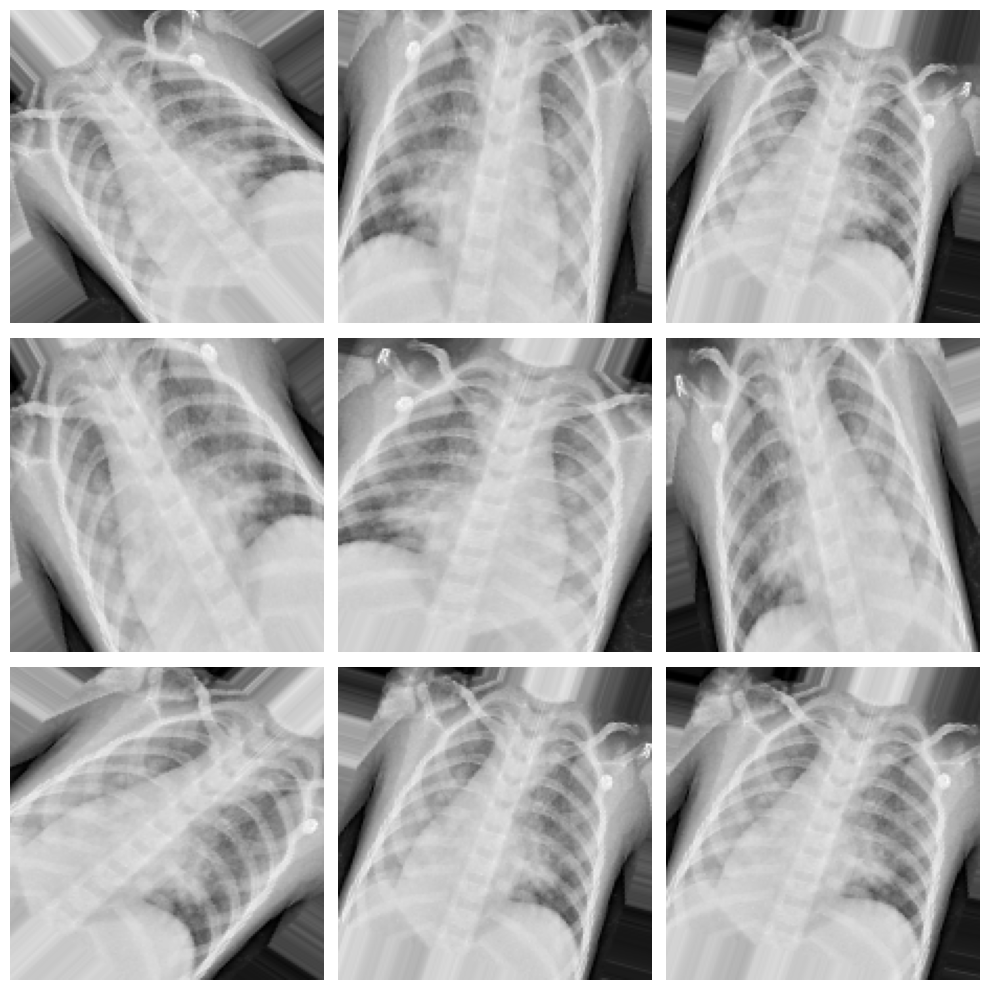

In [ ]:
# Pegando um registro do dataframe
sample = chest_xray.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='images',
    y_col='class',
    target_size=(img_height, img_width),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

##3.0 Arquiteturas testadas

Durante a realização deste trabalho muitas arquiteturas foram testadas e retestadas de forma exaustiva e ficaria difícial a cada alteração de parâmetro ter um registro.

Nesse ítem 3 vou dar uma passada em algumas arquiteturas testadas registrando a evolução alcançada ao longo do ultmo mes. Durante esse tempo não só a definição da arquitetura e o treinamento do modelo (variando o numero de epocas para até 100) foram executados mas também a execução do modelo treinado junto as imagens de teste e toda a avaliação.

No ítem 4 executarei na integra todos os passos utilizando a arquitetura final alcançada.

### 3.1 Definição e treinamento das Arquiteturas

**Primeira Arquitetura**

Iniciei os testes com uma arquitetura mais simples composta de 4 camadas de convolução e pooling com numero crescente de filtros, todas com função de ativação ReLu para extrair características relevantes. Após cada uma delas tem uma camada de pooling para reduzir a dimensionalidade.

Na segunda parte da arquitetura antes de cada camada densa coloquei uma camada de dropout para diminuir o overfitting.

A função ReLu é uma das funções de ativação mais utilizadas em redes neurais e deep learning.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 153s 6s/step - loss: 1.1269 - accuracy: 0.3676 - val_loss: 1.0889 - val_accuracy: 0.5536
Epoch 2/5
26/26 [==============================] - 149s 6s/step - loss: 1.0781 - accuracy: 0.4112 - val_loss: 1.0674 - val_accuracy: 0.3968
Epoch 3/5
26/26 [==============================] - 147s 6s/step - loss: 1.0300 - accuracy: 0.4554 - val_loss: 0.9789 - val_accuracy: 0.5238
Epoch 4/5
26/26 [==============================] - 155s 6s/step - loss: 0.9254 - accuracy: 0.5456 - val_loss: 0.8979 - val_accuracy: 0.6270
Epoch 5/5
26/26 [==============================] - 148s 6s/step - loss: 0.8885 - accuracy: 0.5843 - val_loss: 0.7700 - val_accuracy: 0.6429


**Segunda Arquitetura**

Para a segunda arquitetura registrada aqui no trabalho variei apenas o numero de filtros das camadas e consegui um resultado bem melhor que o primeiro porém com a execução para um numero maior de epocas foi aumentando o overfitting


In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1024 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 128)       73856     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 128)      0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 256)       295168    
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 17, 17, 256)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 335s 13s/step - loss: 1.1155 - accuracy: 0.3586 - val_loss: 1.0721 - val_accuracy: 0.3353
Epoch 2/5
26/26 [==============================] - 320s 12s/step - loss: 1.0500 - accuracy: 0.4509 - val_loss: 1.1000 - val_accuracy: 0.3810
Epoch 3/5
26/26 [==============================] - 327s 13s/step - loss: 1.0071 - accuracy: 0.5060 - val_loss: 0.8733 - val_accuracy: 0.5933
Epoch 4/5
26/26 [==============================] - 320s 12s/step - loss: 0.9342 - accuracy: 0.5536 - val_loss: 0.8407 - val_accuracy: 0.5833
Epoch 5/5
26/26 [==============================] - 317s 12s/step - loss: 0.8016 - accuracy: 0.6235 - val_loss: 0.7014 - val_accuracy: 0.6825


**Terceira Arquitetura**

Para essa terceira arquitetura testei a função de ativação da Tangente Hiperbólica (tanh) em 2 camadas convolucionais. O resultado foi melhor que os anteriores mesmo com o numero de filtros menor que a Segunda Arquitetura.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='tanh'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512, activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 17, 17, 128)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 155s 6s/step - loss: 1.1947 - accuracy: 0.3810 - val_loss: 1.0518 - val_accuracy: 0.3571
Epoch 2/5
26/26 [==============================] - 152s 6s/step - loss: 1.1524 - accuracy: 0.4157 - val_loss: 1.0773 - val_accuracy: 0.5198
Epoch 3/5
26/26 [==============================] - 152s 6s/step - loss: 1.0137 - accuracy: 0.4911 - val_loss: 0.8864 - val_accuracy: 0.6131
Epoch 4/5
26/26 [==============================] - 145s 6s/step - loss: 0.8723 - accuracy: 0.5764 - val_loss: 0.8808 - val_accuracy: 0.5813
Epoch 5/5
26/26 [==============================] - 151s 6s/step - loss: 0.7777 - accuracy: 0.6334 - val_loss: 0.6944 - val_accuracy: 0.6885


**Arquitetura Final**

Por fim cheguei a arquitetura abaixo onde volto a iniciar a primeira camada com 32 filtros e ao longo das novas camadas utilizo novas funções de ativação como a PRelu e a Leaky ReLu. Na camanda densa aumento o percentual do Dropout para 0.30 e na execução integral consagui controlar melhor o overfitting. Com essa nova configuração variada de funções de ativação entendi que tinha atingido um resultado satisfatório. Falarei mais sobre o resultado ao final do trabalho em minhas considerações.

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3)))
model.add(layers.PReLU(alpha_initializer='zeros'))  # Definindo o alpha_initializer para inicializar o parâmetro de inclinação aprendível
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01)))
model.add(layers.MaxPooling2D((2, 2)))



In [ ]:
model.add(layers.Flatten())
model.add(layers.Dropout(0.30))
model.add(layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.01) ))
model.add(layers.PReLU(alpha_initializer='zeros'))  # Definindo o alpha_initializer para inicializar o parâmetro de inclinação aprendível
model.add(layers.Dense(512))
model.add(layers.Dropout(0.30))
model.add(layers.Dense(num_classes, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_72 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_82 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_73 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 p_re_lu_12 (PReLU)          (None, 34, 34, 128)     

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=5 ,
                  validation_data=val_generator)

Epoch 1/5
26/26 [==============================] - 170s 6s/step - loss: 8.1269 - accuracy: 0.3472 - val_loss: 3.6865 - val_accuracy: 0.3353
Epoch 2/5
26/26 [==============================] - 165s 6s/step - loss: 2.3274 - accuracy: 0.3591 - val_loss: 1.4906 - val_accuracy: 0.3294
Epoch 3/5
26/26 [==============================] - 165s 6s/step - loss: 1.2953 - accuracy: 0.3185 - val_loss: 1.1781 - val_accuracy: 0.3294
Epoch 4/5
26/26 [==============================] - 166s 6s/step - loss: 1.1455 - accuracy: 0.3229 - val_loss: 1.1229 - val_accuracy: 0.3294
Epoch 5/5
26/26 [==============================] - 163s 6s/step - loss: 1.1143 - accuracy: 0.3328 - val_loss: 1.1070 - val_accuracy: 0.3353


##4.0 Execução final

Tendo em vista os processamentos acima darei sequencia utilizando a Terceira Arquitetura que nesse momento foi a que teve o melhor desempenho

### 4.1 Treinamento do modelo final para 20 Epocas

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3 )))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='tanh'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='tanh'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512, activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes, activation='softmax' ) )

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [ ]:
history=model.fit(train_generator ,
                  epochs=20 ,
                  validation_data=val_generator)

Epoch 1/20
26/26 [==============================] - 185s 7s/step - loss: 1.2258 - accuracy: 0.3834 - val_loss: 1.0627 - val_accuracy: 0.3671
Epoch 2/20
26/26 [==============================] - 146s 6s/step - loss: 1.0517 - accuracy: 0.4633 - val_loss: 1.0200 - val_accuracy: 0.5417
Epoch 3/20
26/26 [==============================] - 151s 6s/step - loss: 0.9551 - accuracy: 0.5203 - val_loss: 0.8572 - val_accuracy: 0.5952
Epoch 4/20
26/26 [==============================] - 151s 6s/step - loss: 0.7979 - accuracy: 0.6195 - val_loss: 0.7165 - val_accuracy: 0.6865
Epoch 5/20
26/26 [==============================] - 151s 6s/step - loss: 0.7258 - accuracy: 0.6443 - val_loss: 0.6550 - val_accuracy: 0.6944
Epoch 6/20
26/26 [==============================] - 151s 6s/step - loss: 0.7176 - accuracy: 0.6503 - val_loss: 0.6880 - val_accuracy: 0.6548
Epoch 7/20
26/26 [==============================] - 150s 6s/step - loss: 0.7605 - accuracy: 0.6424 - val_loss: 0.7122 - val_accuracy: 0.6567
Epoch 8/20
26

### 4.2 Execução do modelo para as imagens de teste

3/3 [==============================] - 1s 292ms/step


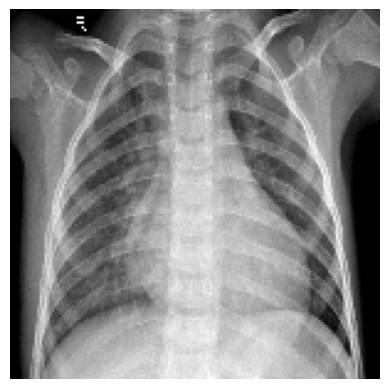

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.39862904


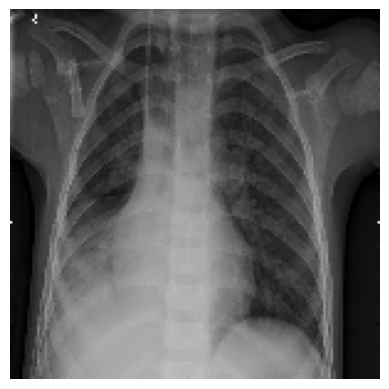

Label:  bacteria
Previsão:  virus
Probabilidade:  0.6348032


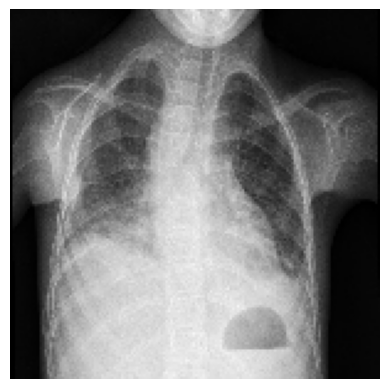

Label:  virus
Previsão:  virus
Probabilidade:  0.716929


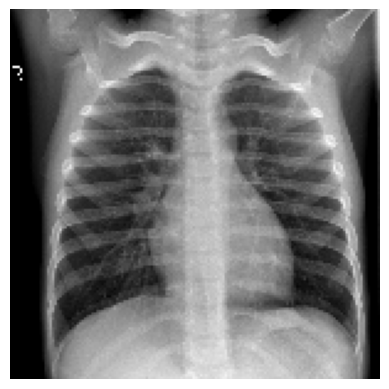

Label:  normal
Previsão:  normal
Probabilidade:  0.94649535


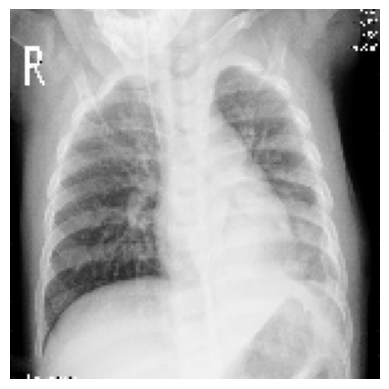

Label:  bacteria
Previsão:  virus
Probabilidade:  0.66230875


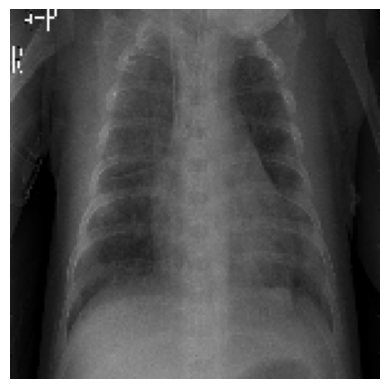

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.78929806


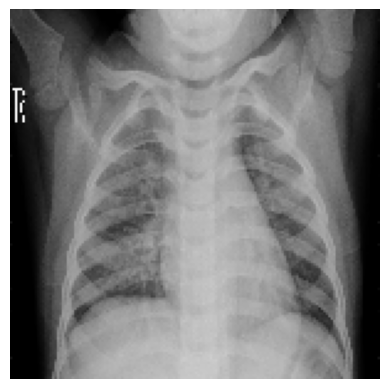

Label:  bacteria
Previsão:  virus
Probabilidade:  0.4725172


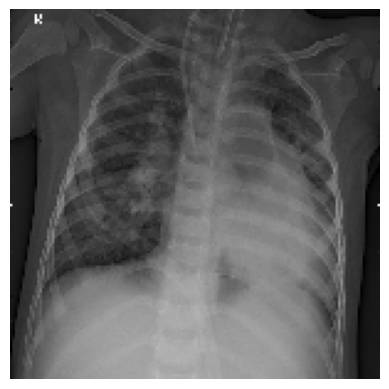

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6212794


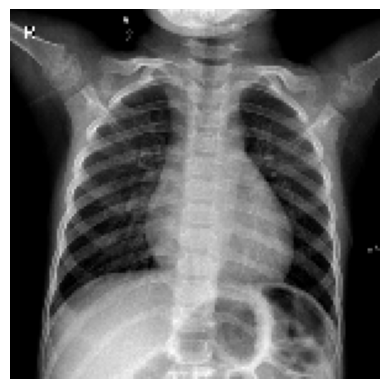

Label:  normal
Previsão:  normal
Probabilidade:  0.5342721


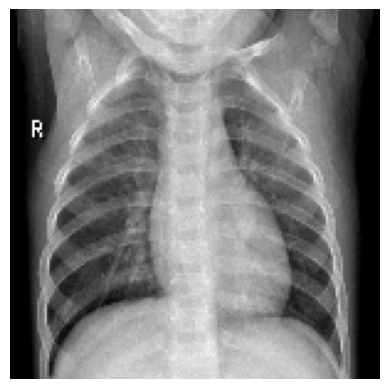

Label:  virus
Previsão:  normal
Probabilidade:  0.89475197


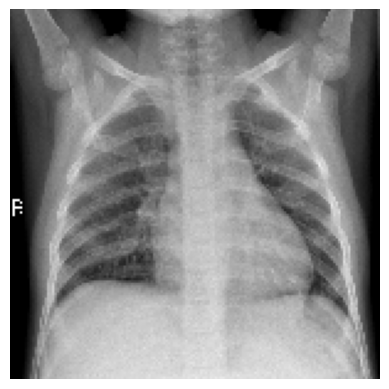

Label:  normal
Previsão:  normal
Probabilidade:  0.8312151


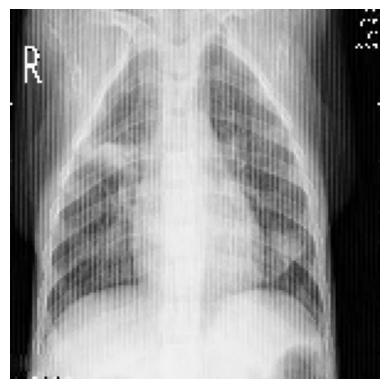

Label:  bacteria
Previsão:  virus
Probabilidade:  0.8612951


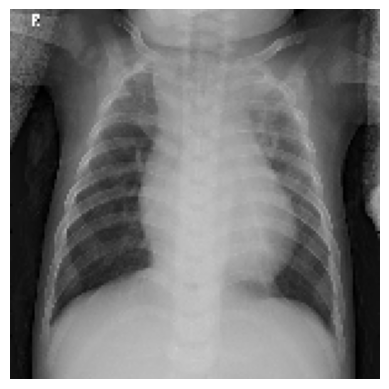

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.74418575


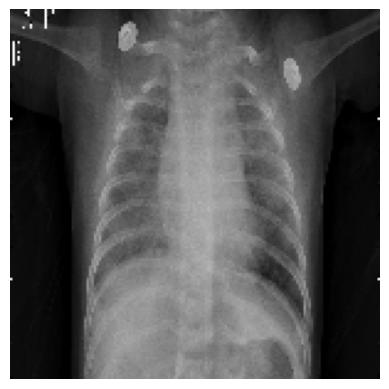

Label:  virus
Previsão:  bacteria
Probabilidade:  0.58801466


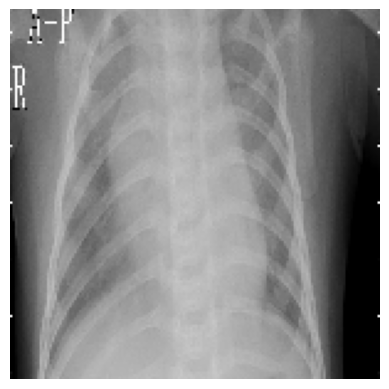

Label:  virus
Previsão:  bacteria
Probabilidade:  0.86248994


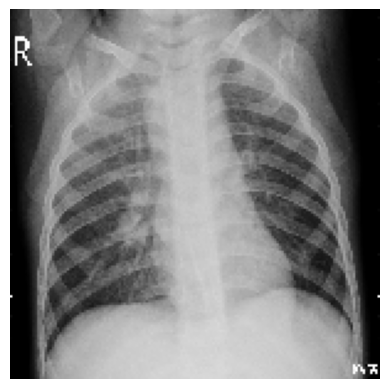

Label:  virus
Previsão:  virus
Probabilidade:  0.6823973


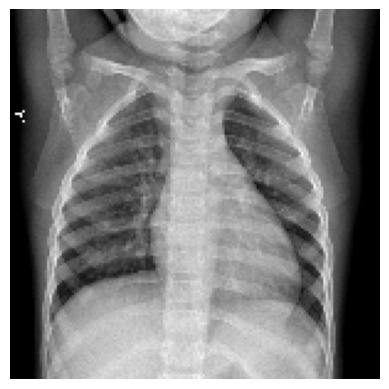

Label:  normal
Previsão:  normal
Probabilidade:  0.93230224


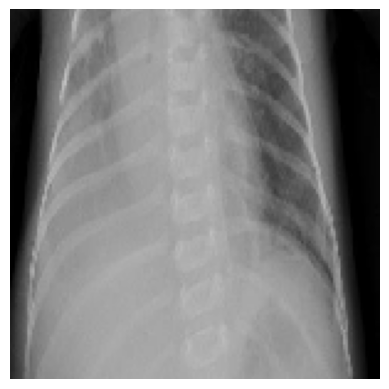

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5911901


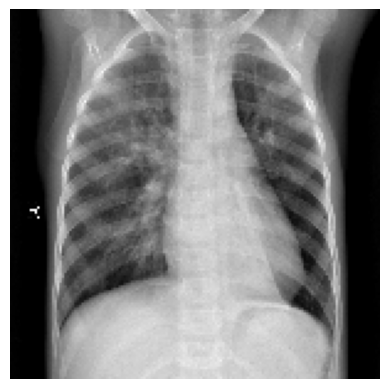

Label:  virus
Previsão:  virus
Probabilidade:  0.44980508


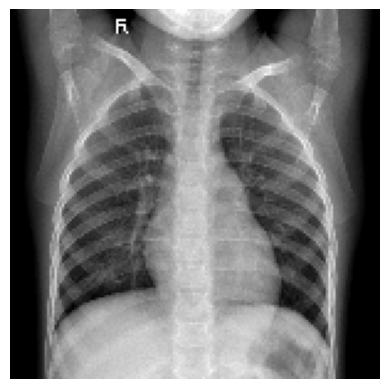

Label:  normal
Previsão:  normal
Probabilidade:  0.9915022


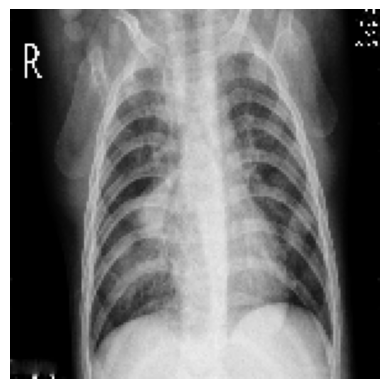

Label:  bacteria
Previsão:  virus
Probabilidade:  0.80878717


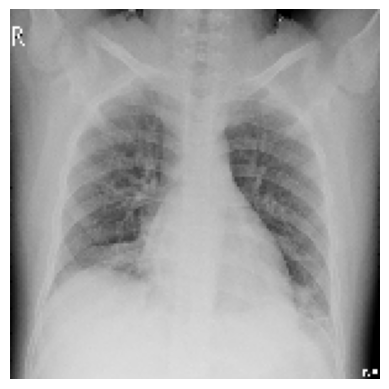

Label:  virus
Previsão:  virus
Probabilidade:  0.48040766


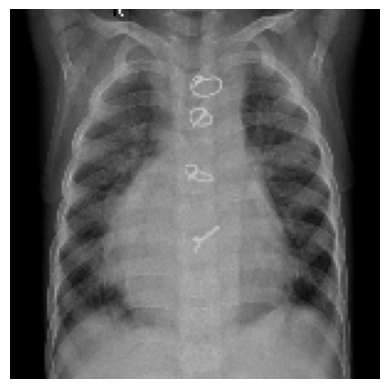

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.53702945


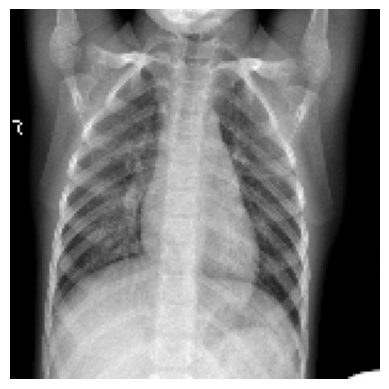

Label:  normal
Previsão:  normal
Probabilidade:  0.9570515


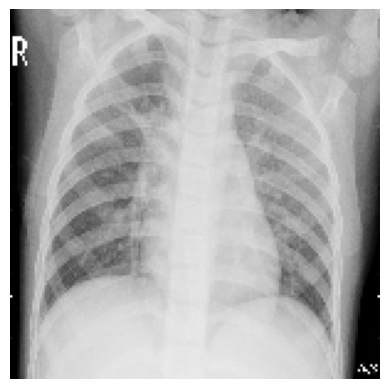

Label:  virus
Previsão:  virus
Probabilidade:  0.76807684


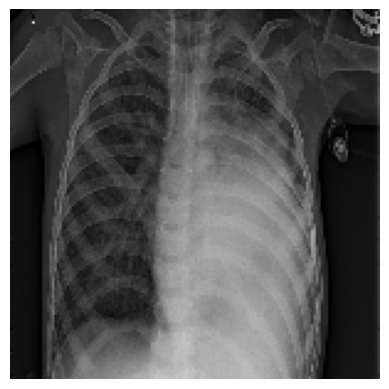

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5283001


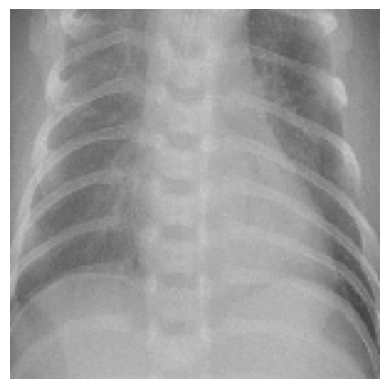

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5329045


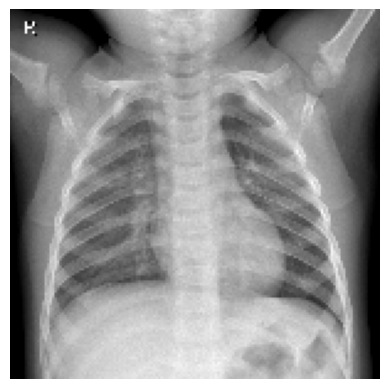

Label:  normal
Previsão:  normal
Probabilidade:  0.9780631


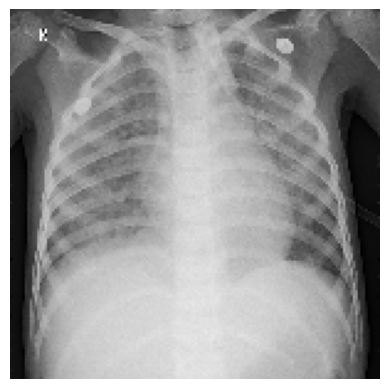

Label:  virus
Previsão:  bacteria
Probabilidade:  0.6850344


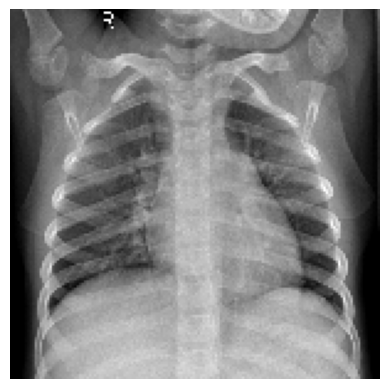

Label:  normal
Previsão:  normal
Probabilidade:  0.8911448


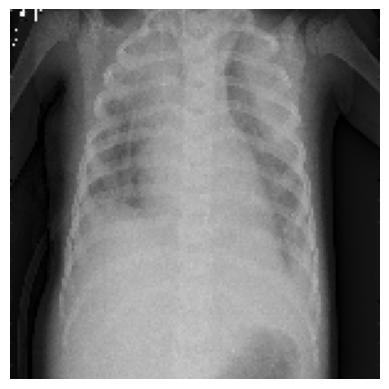

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6095934


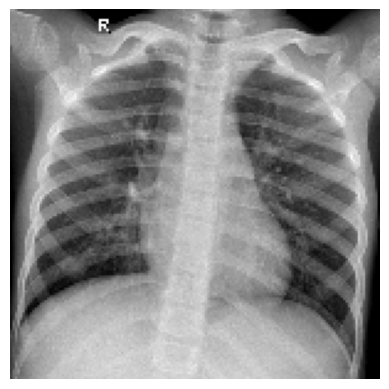

Label:  normal
Previsão:  normal
Probabilidade:  0.89356744


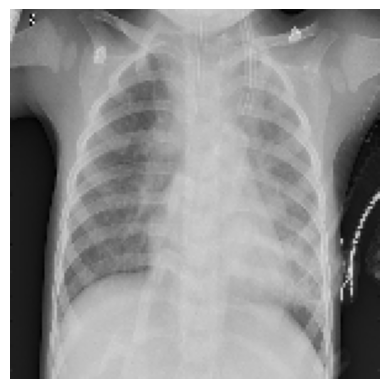

Label:  virus
Previsão:  bacteria
Probabilidade:  0.61931


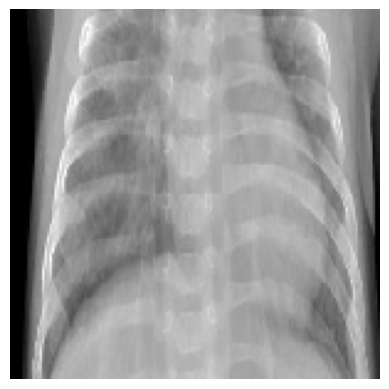

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.520249


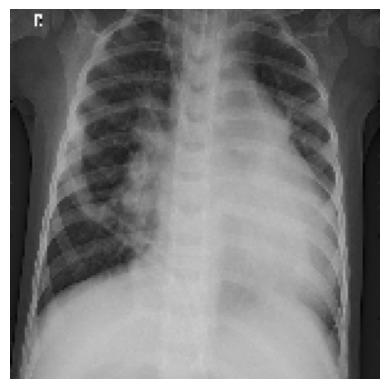

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.78381395


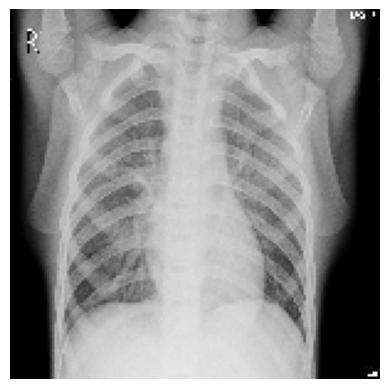

Label:  virus
Previsão:  virus
Probabilidade:  0.79791087


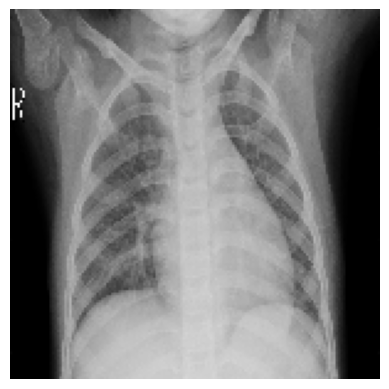

Label:  bacteria
Previsão:  virus
Probabilidade:  0.6244642


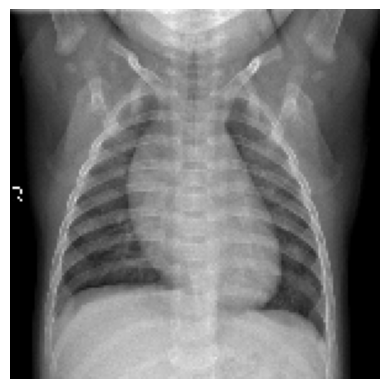

Label:  normal
Previsão:  normal
Probabilidade:  0.7407989


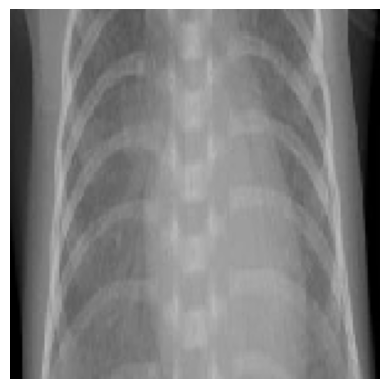

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5235529


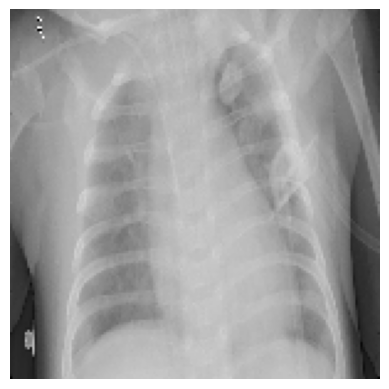

Label:  virus
Previsão:  bacteria
Probabilidade:  0.7146854


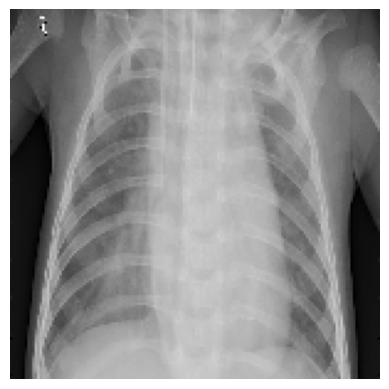

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6811496


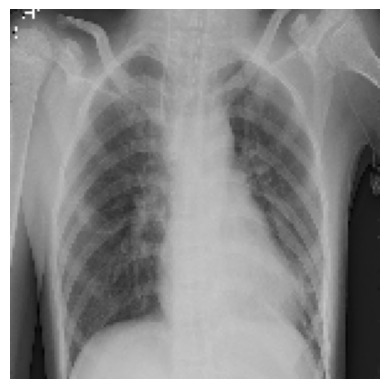

Label:  virus
Previsão:  virus
Probabilidade:  0.47792837


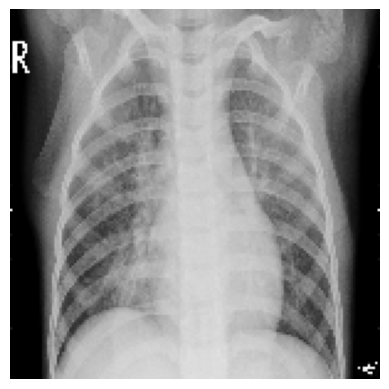

Label:  virus
Previsão:  virus
Probabilidade:  0.871453


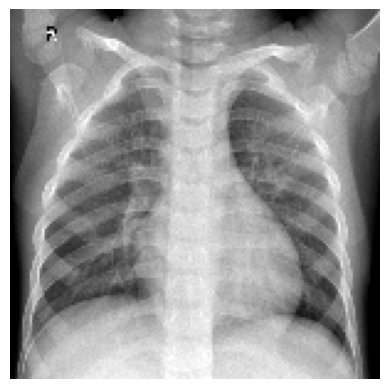

Label:  normal
Previsão:  normal
Probabilidade:  0.90359205


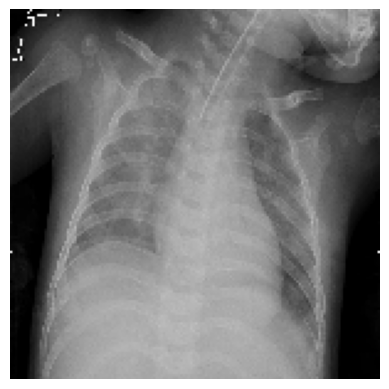

Label:  virus
Previsão:  bacteria
Probabilidade:  0.6843628


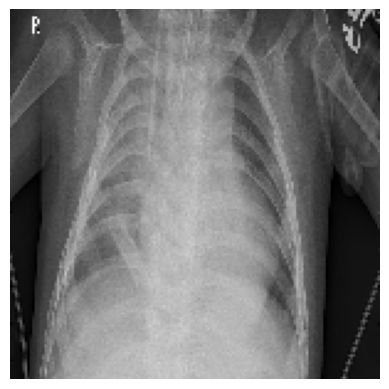

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.71016866


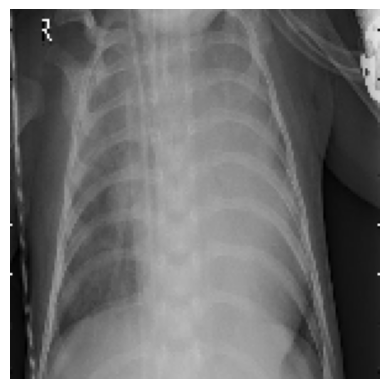

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.80871063


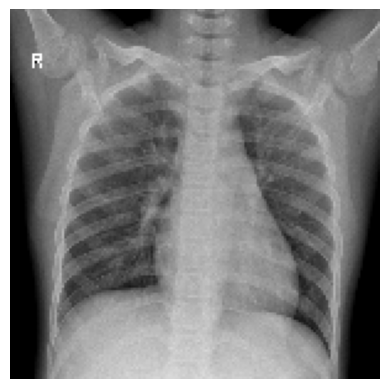

Label:  normal
Previsão:  normal
Probabilidade:  0.9580355


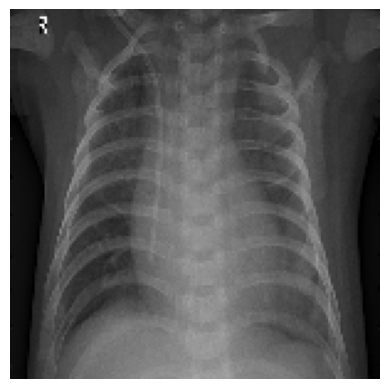

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.75970393


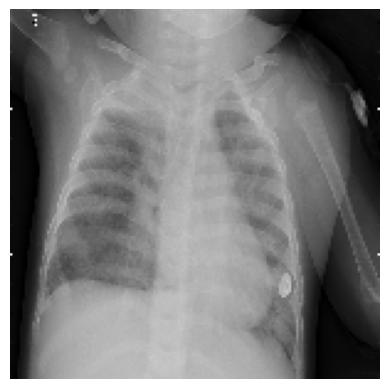

Label:  bacteria
Previsão:  virus
Probabilidade:  0.51414776


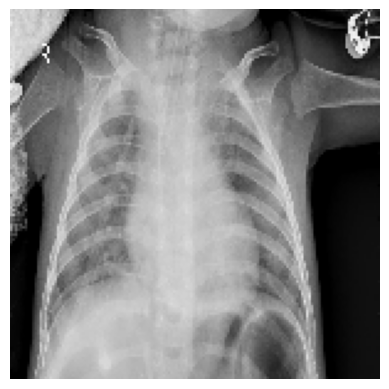

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5551255


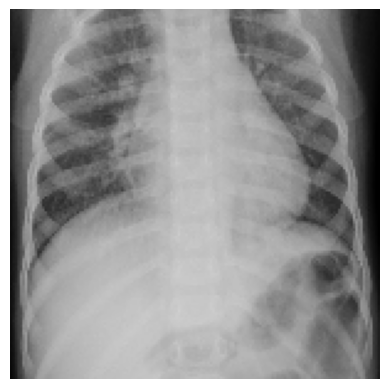

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5130851


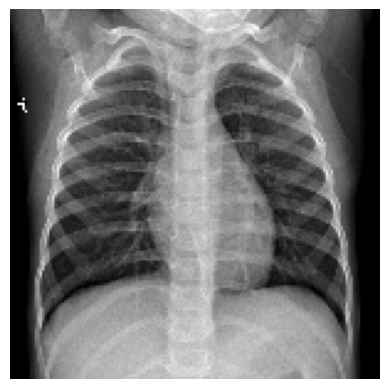

Label:  normal
Previsão:  normal
Probabilidade:  0.9333984


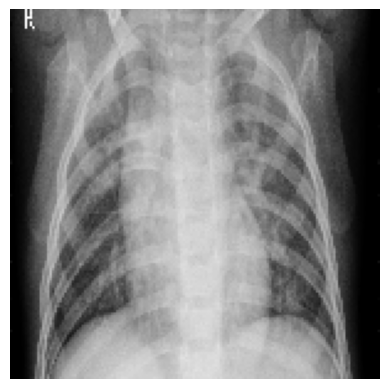

Label:  virus
Previsão:  virus
Probabilidade:  0.60633415


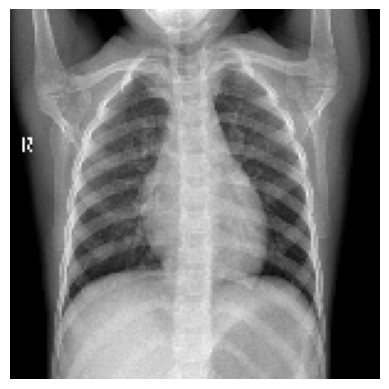

Label:  normal
Previsão:  normal
Probabilidade:  0.9733756


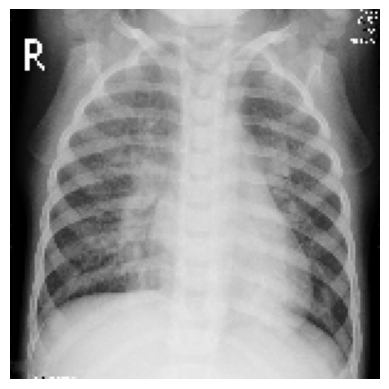

Label:  virus
Previsão:  virus
Probabilidade:  0.6795532


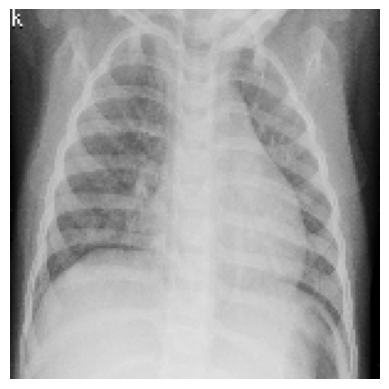

Label:  bacteria
Previsão:  virus
Probabilidade:  0.6353018


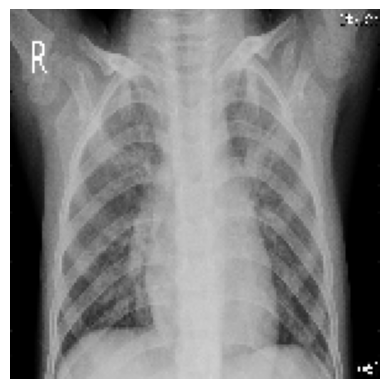

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5107742


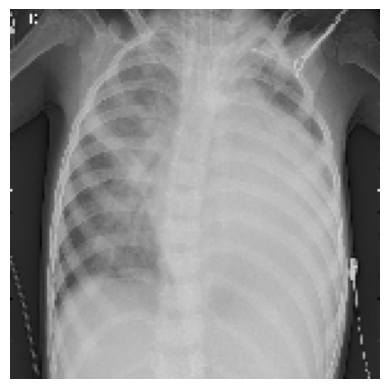

Label:  virus
Previsão:  bacteria
Probabilidade:  0.8281319


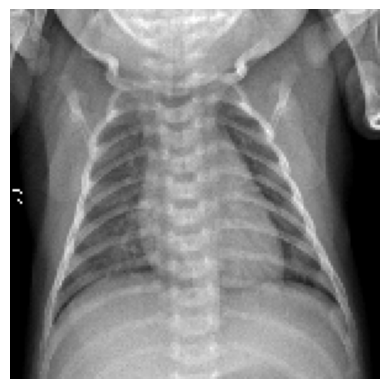

Label:  normal
Previsão:  normal
Probabilidade:  0.8361109


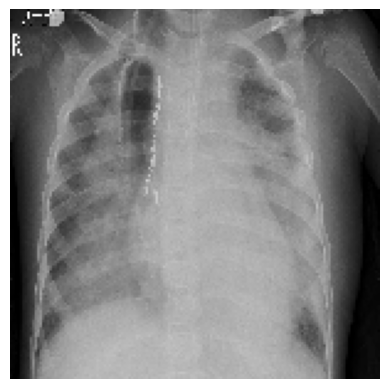

Label:  virus
Previsão:  bacteria
Probabilidade:  0.7385637


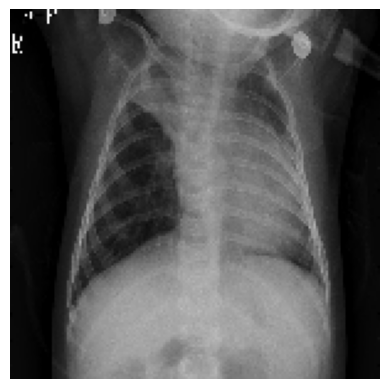

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.52109474


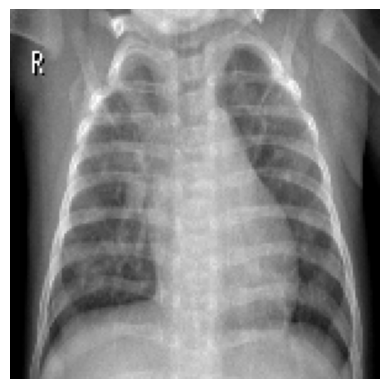

Label:  bacteria
Previsão:  normal
Probabilidade:  0.4427445


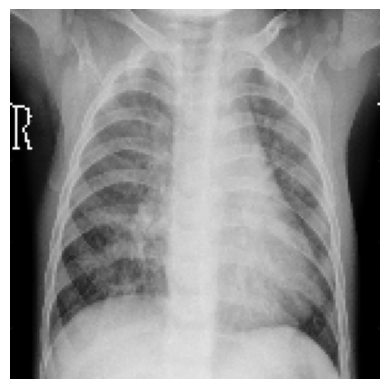

Label:  virus
Previsão:  virus
Probabilidade:  0.6121264


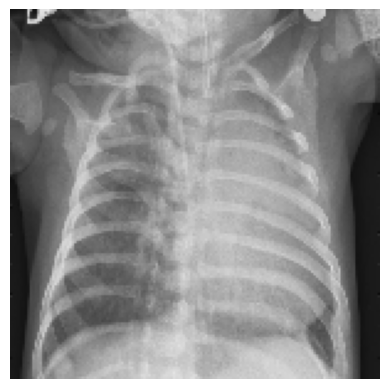

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.48432797


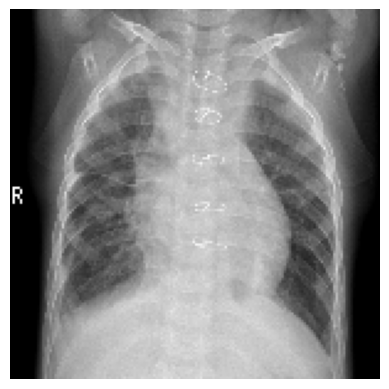

Label:  bacteria
Previsão:  virus
Probabilidade:  0.45195362


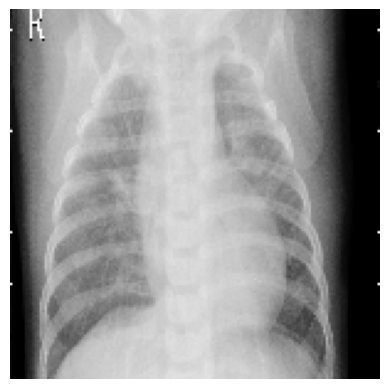

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.58613026


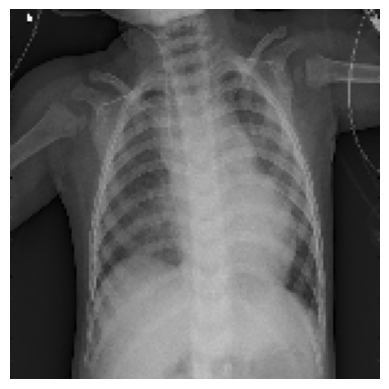

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.510233


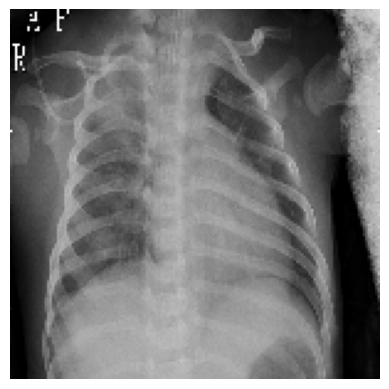

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.40033582


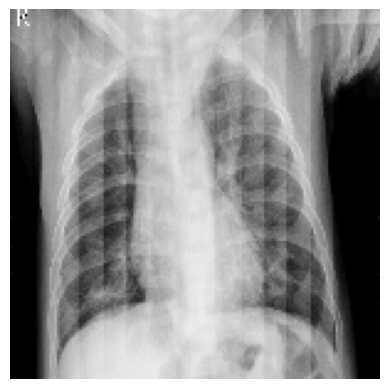

Label:  virus
Previsão:  virus
Probabilidade:  0.8980296


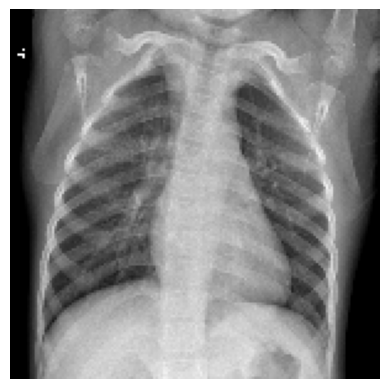

Label:  normal
Previsão:  normal
Probabilidade:  0.88122976


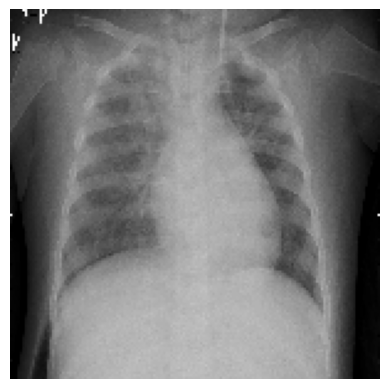

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.4973834


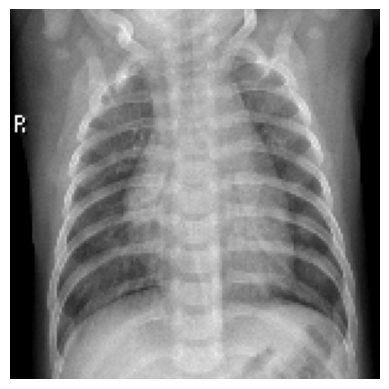

Label:  virus
Previsão:  normal
Probabilidade:  0.4505419


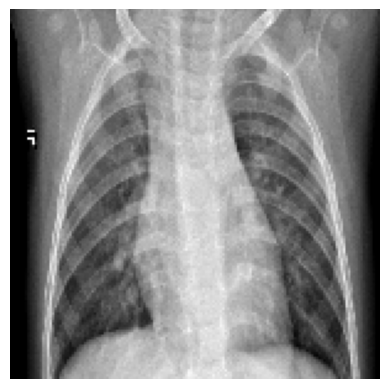

Label:  virus
Previsão:  normal
Probabilidade:  0.57343465


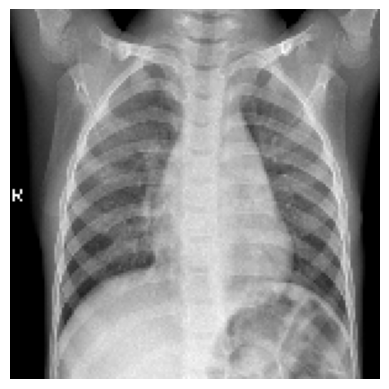

Label:  normal
Previsão:  normal
Probabilidade:  0.56297135


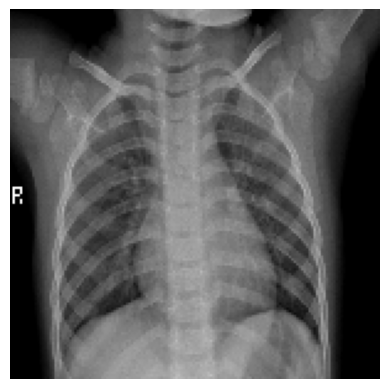

Label:  virus
Previsão:  normal
Probabilidade:  0.7000225


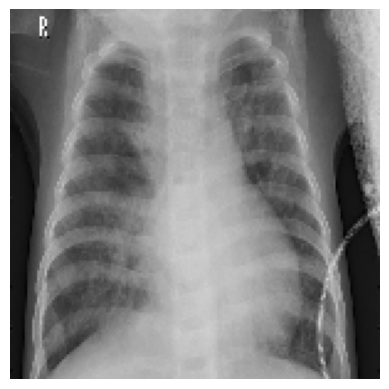

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6711971


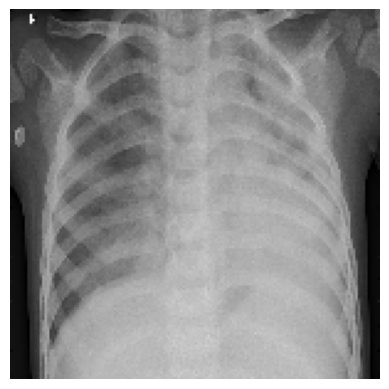

Label:  virus
Previsão:  bacteria
Probabilidade:  0.6263333


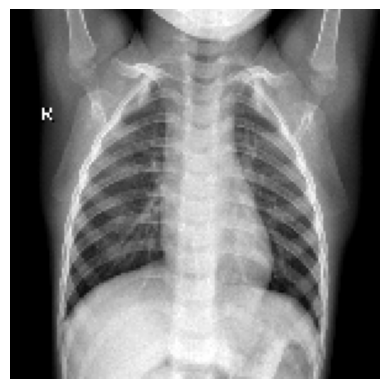

Label:  normal
Previsão:  normal
Probabilidade:  0.9899713


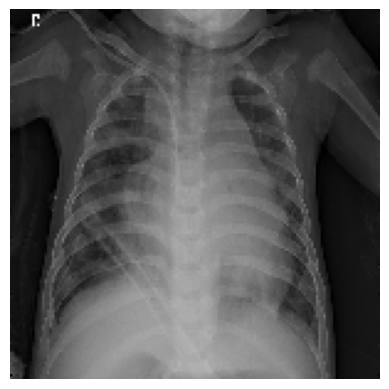

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.7210159


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

            y_true.append(real)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", real)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

### 4.3 Verificação das metricas alcançadas

Ao final, o modelo atingiu uma acertividade no teste em torno de 66% levando em consideração a acurácia, a precisão, o recall e o F1-Score, mais a frente  veremos que essa taxa chega a 73% quando verificada com uma quantidade maior de imagens, demonstrando um desempenho ainda mais promissor.

In [ ]:
loss, accuracy = model.evaluate(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

14/14 [==============================] - 27s 2s/step - loss: 0.5398 - accuracy: 0.7444
Test: accuracy = 0.744444  ;  loss = 0.539794 


In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.6375
Precision:  0.6199968030690537
Recall:  0.6375
F1 Score:  0.6234507574696873


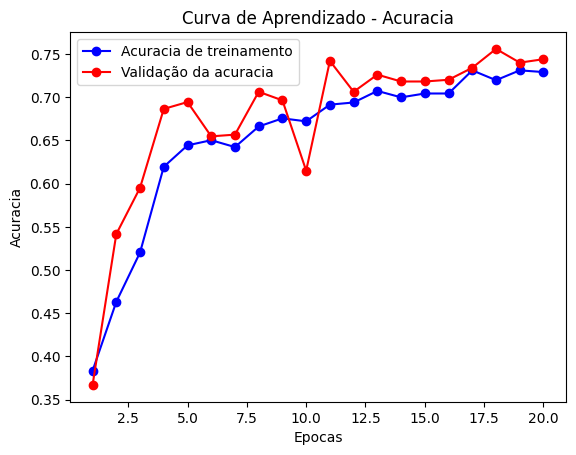

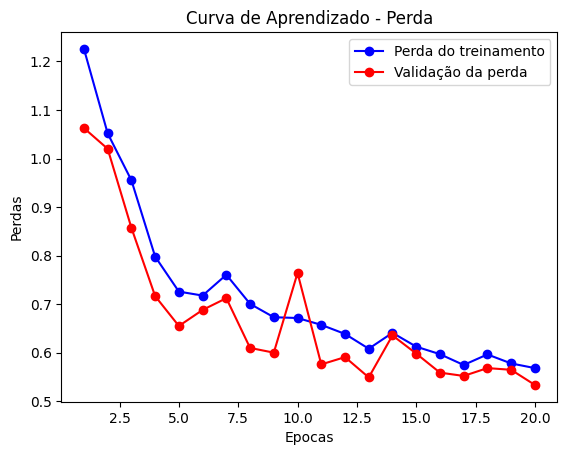

In [ ]:
# Grafico da curva de aprendizado
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the learning curve
epochs = range(1, len(train_acc) + 1)
plt.plot(epochs, train_acc, 'bo-', label='Acuracia de treinamento')
plt.plot(epochs, val_acc, 'ro-', label='Validação da acuracia')
plt.title('Curva de Aprendizado - Acuracia')
plt.xlabel('Epocas')
plt.ylabel('Acuracia')
plt.legend()
plt.show()

plt.plot(epochs, train_loss, 'bo-', label='Perda do treinamento')
plt.plot(epochs, val_loss, 'ro-', label='Validação da perda')
plt.title('Curva de Aprendizado - Perda')
plt.xlabel('Epocas')
plt.ylabel('Perdas')
plt.legend()
plt.show()

Matriz de confusão sem normalização


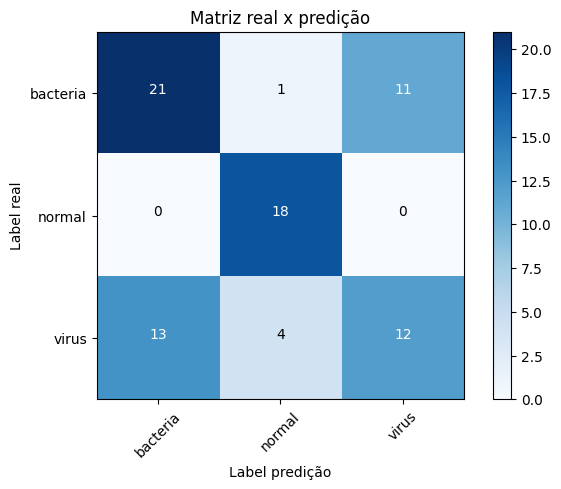

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['bacteria',
                               'normal',
                              'virus'],
                      normalize= False,
                      title='Matriz real x predição')

##5.0 Salvando e Recuperando o modelo

Para que não seja necessário treinar o modelo todas as vezes que for executar vamo salvar o modelo treinado e depois vamos carregar uma cópia previamente salva no Google Drive


In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
formato = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(formato)

path_model = 'datasets/chest/trained_model'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-23T0658.h5


In [ ]:
# Realizando o download do modelo treinado
# Path onde se encontra o arquivo 'trained_model_chest_xray.h5'
file_id = '1djra-LXeozWTuccM-T7LOjiDMih80gqD'
url = f"https://drive.google.com/uc?id={file_id}"
path_model = 'datasets/chest/trained_model'
name_model = 'datasets/chest/trained_model/trained_model_chest_xray.h5'
gdown.download(url, name_model)


Downloading...
From: https://drive.google.com/uc?id=1djra-LXeozWTuccM-T7LOjiDMih80gqD
To: /content/datasets/chest/trained_model/trained_model_chest_xray.h5
100%|██████████| 41.5M/41.5M [00:00<00:00, 189MB/s]


'datasets/chest/trained_model/trained_model_chest_xray.h5'

In [ ]:
# Carregando o modelo treinado
name_model = 'trained_model_chest_xray.h5'
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_chest_xray.h5 carregado com sucesso


##6.0 Testando o modelo salvo

Executaremos agora um teste com o modelo que foi recuperado utilizando uma quantidade maior de dados. Para esse teste não irei mostrar as imagens, apenas o resultado.

In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    #Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 10:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

            y_true.append(real)
            y_pred.append(class_name)


3/3 [==============================] - 1s 291ms/step


Conforme mencionado anteriormente, com uma quantidade maior de imagens o modelo conseguiu uma performance ainda melhor atingindo uma acertividade em torno de 73%

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.7375
Precision:  0.731413231679189
Recall:  0.7375
F1 Score:  0.7276470021852257


Matriz de confusão sem normalização


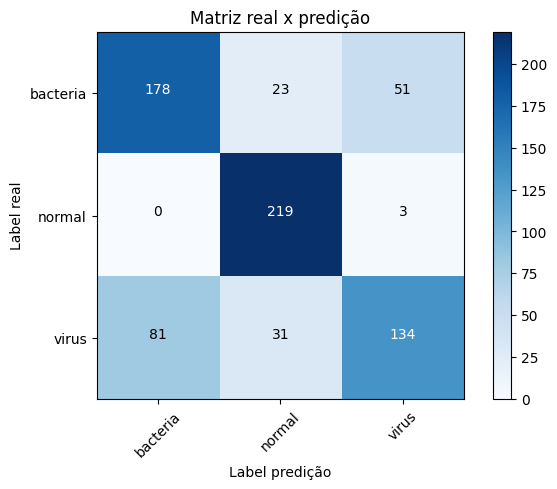

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['bacteria',
                               'normal',
                              'virus'],
                      normalize= False,
                      title='Matriz real x predição')

##7.0 Considerações finais

Inicialmente esse conjunto de imagens possuía apenas 2 classes, Normal ou Pneumonia. Implementei as 3 classes com instinto curioso de testar e explorar qual seria a reação do modelo treinado. Acredito que dentro das condições possíveis o modelo teve um desempenho muito bom. Podemos ver claramente que ele identifica bem os casos Normais, mas demonstra uma certa confusão para separar os casos Bacterianos dos Virais, principalmente quando é um quadro viral.
Para tentar melhorar esse problema eu aumentei o tamanho das imagens e com tamanho de 600 teve uma melhora perceptível, porém eu estava utilizando a GPU do ambiente Colab e elas não estavam disponíveis para a finalização do trabalho. Precisei reduzir o tamanho para 150 e diminuir o número de épocas do treinamento para me adaptar aos recursos disponíveis no momento.

Outro ponto a considerar é referente a utilização do ImageDataGenerator. Sou leigo no assunto para saber até que ponto uma imagem de um caso clínico alterada pode influenciar em um diagnóstico. Sei que formato de tumores podem dizer muito sobre seu tipo e não sei como ficaria nessa situação. Pesquisei e encontrei em um blog uma matéria de um médico que usava e estava satisfeito com o resultado, porém li vários trabalhos médicos publicados e nenhum falava sobre o assunto, em geral o treinamento era realizado em bibliotecas de imagens realmente grandes. Como o intuito aqui é didático eu utilizei o ImageDataGenerator.  

# Olhar Crítico

Qual é o melhor modelo? Existe o melhor modelo?

Desenvolvi esse trabalho praticamente ao longo de todo o prazo disponível para ele. Um pouco a cada dia sempre conciliando as noites disponíveis também com a família e com o descanso (nem sempre possível). É o meu primeiro trabalho com Deep Learning e fui me acostumando com os processamentos demorados dos modelos que cada vez mais eu queria aprimorar e mais demorado ficavam.

Nas duas últimas semanas descobri a utilização da GPU no ambiente do Colab e imediatamente minha imaginação processou na mesma aceleração que tinha conquistado para meu trabalho. Pude melhorar as imagens processadas, aumentar o número de camadas do modelo, variar as funções de ativação e aumentar exponencialmente o número de épocas do treinamento. “Fantastic”, em pouco tempo cheguei a uma arquitetura que considerei quase perfeita, obteve uma acurácia muito boa e sem overfitting, com um pouco mais de tempo e treino seria imbatível.

A três dias da entrega não consegui acesso aos recursos que mudaram o meu trabalho (pausa e silêncio). De repente meu modelo perfeito não existia mais, não tinha mais tempo para os últimos acertos que já estavam na cabeça, mas não estavam implementados. Tive que voltar aos rascunhos, rever o que já estava descartado, reinventar. Nesse momento encontro o patinho feio, uma configuração simples que nunca apostei minhas fichas nela. Talvez não tenha sido testado corretamente ou com os melhores parâmetros, mas agora, da forma que estou testando, mostrou ser até melhor do que o modelo dos sonhos. Me mostrou que o melhor modelo existe sim e não é necessariamente o mais complexo ou o que possui a maior acurácia. Em vez disso, o melhor modelo é aquele que se adapta às limitações e recursos disponíveis para cada trabalho específico.